# Problem Set 1
March 5, 2017
Irene Chen (iychen@mit.edu)

HW: http://people.csail.mit.edu/dsontag/courses/mlhc17/hw/ps1.pdf

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re

import scipy as sp

from scipy.stats import zscore
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression as LR
from sklearn.linear_model import LinearRegression as LinR
from sklearn.metrics import roc_curve, auc

# below imports are used to print out pretty pandas dataframes
from IPython.display import display, HTML

%matplotlib inline
plt.style.use('ggplot')

## Section 1

### Question 1
Advantages and disadvantages of setups.
* 1 year mortality vs in-ICU mortality
     * Although 1 year mortality is more medically relevant to patients and the larger question people would care about, restricting to in-ICU mortality allows for a cleaner analysis since you have more data about disease progression and remove most exogenous factors (e.g. hit by a car). 
* Data collected in first 48 hours vs entire visit
    * Because visit lengths of the ICU can vary (either through checkout or death), if we collect data across the entire visit, we may be skewing the data for alive people. On the other hand, more data would be helpful to feed the model, and data could be left blank on early expiration of the patient.
    * First 48 hour data collection allows for a smaller window to analyze and therefore have cleaner analysis. From a medical perspective, it is less compelling since some conditions take a longer time to develop and present symptoms.

### Question 2

In [186]:
# Read adult_icu.gz
adult_df = pd.read_csv('adult_icu.gz')
adult_df.head()

,subject_id,hadm_id,icustay_id,age,mort_hosp,mort_icu,mort_oneyr,first_hosp_stay,first_icu_stay,adult_icu,...,phosphate,platelet,potassium,ptt,inr,pt,sodium,bun,wbc,train
0,3,145834,211552,76.0,0,0,0,1,1,1,...,4.8,282.0,5.4,30.7,1.3,13.5,136.0,53.0,12.7,1
1,6,107064,228232,65.0,0,0,0,1,1,1,...,8.5,315.0,5.4,139.0,1.4,14.6,138.0,62.0,10.6,1
2,9,150750,220597,41.0,1,1,1,1,1,1,...,2.9,258.0,2.8,21.7,1.1,12.7,140.0,16.0,7.5,0
3,12,112213,232669,72.0,1,0,1,1,1,1,...,6.6,156.0,4.9,55.2,1.7,15.9,138.0,28.0,8.4,1
4,13,143045,263738,39.0,0,0,0,1,1,1,...,3.9,216.0,3.5,44.1,1.2,13.7,139.0,13.0,16.6,0


First some data cleaning. Let's only keep the features that would be measured in the first 48 hours and remove other potentially misleading information (e.g. mortality in one year)

In [187]:
print adult_df.columns

excl_col = set(['subject_id', 'hadm_id', 'icustay_id', 'mort_oneyr', 'mort_hosp',
                'adult_icu', 'train', 'mort_icu'])
target_col = 'mort_icu'
feature_col = [i for i in adult_df.columns if i not in excl_col]

# Additionally we want to zscore the remaining features
adult_df[feature_col].apply(zscore)

Index([u'subject_id', u'hadm_id', u'icustay_id', u'age', u'mort_hosp',
       u'mort_icu', u'mort_oneyr', u'first_hosp_stay', u'first_icu_stay',
       u'adult_icu', u'eth_asian', u'eth_black', u'eth_hispanic', u'eth_other',
       u'eth_white', u'admType_ELECTIVE', u'admType_EMERGENCY',
       u'admType_NEWBORN', u'admType_URGENT', u'heartrate_min',
       u'heartrate_max', u'heartrate_mean', u'sysbp_min', u'sysbp_max',
       u'sysbp_mean', u'diasbp_min', u'diasbp_max', u'diasbp_mean',
       u'meanbp_min', u'meanbp_max', u'meanbp_mean', u'resprate_min',
       u'resprate_max', u'resprate_mean', u'tempc_min', u'tempc_max',
       u'tempc_mean', u'spo2_min', u'spo2_max', u'spo2_mean', u'glucose_min',
       u'glucose_max', u'glucose_mean', u'aniongap', u'albumin',
       u'bicarbonate', u'bilirubin', u'creatinine', u'chloride', u'glucose',
       u'hematocrit', u'hemoglobin', u'lactate', u'magnesium', u'phosphate',
       u'platelet', u'potassium', u'ptt', u'inr', u'pt', u'sodium', u'

,age,first_hosp_stay,first_icu_stay,eth_asian,eth_black,eth_hispanic,eth_other,eth_white,admType_ELECTIVE,admType_EMERGENCY,...,magnesium,phosphate,platelet,potassium,ptt,inr,pt,sodium,bun,wbc
0,0.793887,0.546139,0.303168,-0.152053,-0.322818,-0.182447,-0.408074,0.642115,-0.390655,0.436692,...,0.874706,0.723545,0.342360,1.369370,-0.324081,-0.241732,-0.348965,-0.371095,1.041051,-0.006248
1,0.109824,0.546139,0.303168,-0.152053,-0.322818,-0.182447,-0.408074,0.642115,2.559807,-2.289942,...,0.069497,3.335831,0.593822,1.369370,4.449346,-0.158231,-0.217297,0.009146,1.425438,-0.215525
2,-1.382676,0.546139,0.303168,-0.152053,-0.322818,-0.182447,2.450535,-1.557354,-0.390655,0.436692,...,-0.333108,-0.617899,0.159479,-1.713925,-0.720764,-0.408733,-0.444723,0.389386,-0.539206,-0.524457
3,0.545137,0.546139,0.303168,-0.152053,-0.322818,-0.182447,-0.408074,0.642115,2.559807,-2.289942,...,-0.534410,1.994387,-0.617768,0.776429,0.755780,0.092270,-0.061689,0.009146,-0.026690,-0.434767
4,-1.507051,0.546139,0.303168,-0.152053,-0.322818,-0.182447,-0.408074,0.642115,-0.390655,0.436692,...,-0.735713,0.088124,-0.160564,-0.883807,0.266537,-0.325232,-0.325025,0.199266,-0.667335,0.382408
5,-1.009551,0.546139,0.303168,-0.152053,-0.322818,-0.182447,-0.408074,0.642115,2.559807,-2.289942,...,-1.138317,-1.253320,-0.754929,-0.409454,-0.275597,-0.074731,-0.181387,0.199266,-0.752754,-0.225490
6,1.477949,0.546139,0.303168,-0.152053,-0.322818,-0.182447,-0.408074,0.642115,-0.390655,0.436692,...,0.069497,1.500171,0.182339,0.895017,4.934182,2.012783,0.848017,0.389386,2.792147,1.070031
7,1.477949,-1.831037,0.303168,-0.152053,-0.322818,-0.182447,-0.408074,0.642115,-0.390655,0.436692,...,-0.937015,0.441136,0.289020,-0.528042,-0.280005,0.092270,0.201647,-0.180974,0.870213,1.767619
8,-0.325488,0.546139,0.303168,-0.152053,-0.322818,-0.182447,-0.408074,0.642115,-0.390655,0.436692,...,-0.333108,0.511738,0.243299,-1.120983,-0.152184,-0.492234,-0.432754,-0.751335,0.912922,-0.056076
9,0.545137,0.546139,0.303168,-0.152053,-0.322818,-0.182447,2.450535,-1.557354,-0.390655,0.436692,...,0.270799,-1.112115,-0.526327,0.302076,-0.478347,0.676774,0.297406,0.959747,0.186858,-0.454698


In [188]:
is_train = adult_df['train'] == 1
is_test = adult_df['train'] == 0

X_train = adult_df[is_train][feature_col]
y_train = adult_df[is_train][target_col]

X_test = adult_df[is_test][feature_col]
y_test = adult_df[is_test][target_col]

logreg = LR()
logreg.fit(X_train, y_train)

coef_vars = sorted(zip((logreg.coef_[0]), feature_col)) 

# What are the top five and bottom five predictors?
print 'TOP 5 HIGHEST'

for i,j in coef_vars[-1:-6:-1]:
    print '%s: %.4f' % (j,i)

print 
    
print 'TOP 5 LOWEST'
for i,j in coef_vars[:5]:
    print '%s: %.4f' % (j,i)

TOP 5 HIGHEST
admType_EMERGENCY: 0.4797
eth_other: 0.4065
tempc_max: 0.3237
admType_URGENT: 0.2220
eth_asian: 0.1912

TOP 5 LOWEST
admType_ELECTIVE: -0.6885
albumin: -0.4168
eth_hispanic: -0.3237
tempc_mean: -0.2806
eth_black: -0.2542


AUROC: 0.7848


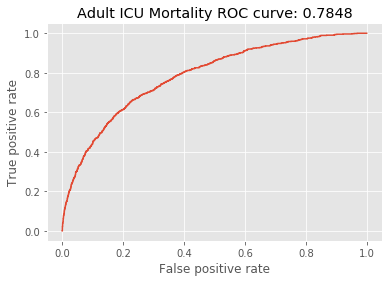

In [189]:
y_prob = logreg.predict_proba(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])

roc_auc = auc(fpr, tpr)
print 'AUROC: %.4f' % roc_auc
plt.plot(fpr, tpr)
plt.title('Adult ICU Mortality ROC curve: %.4f' % roc_auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.show()

### Question 3


**3a)** Because the model is trained on adult data, the weights will be for predicting for adult patients. It would be incorrect and irresponsible to use the adult model in the NICU.

**3b)** Let's run the same analysis for the NICU

In [198]:
# Read adult_icu.gz
nicu_df = pd.read_csv('n_icu.gz')
nicu_df.head()

,subject_id,hadm_id,icustay_id,age,mort_hosp,mort_icu,mort_oneyr,first_hosp_stay,first_icu_stay,adult_icu,...,phosphate,platelet,potassium,ptt,inr,pt,sodium,bun,wbc,train
0,10,184167,288409,0.0,0,0,0,1,1,0,...,5.90000,414.0,5.100000,58.912500,1.725000,17.406250,133.000000,18.34127,9.2,0
1,39,106266,249426,0.0,0,0,0,1,1,0,...,5.90000,347.0,5.900000,58.912500,1.725000,17.406250,135.000000,18.34127,12.3,1
2,66,104518,283361,0.0,0,0,0,1,1,0,...,5.90000,143.0,5.045889,58.912500,1.725000,17.406250,139.166814,18.34127,16.9,1
3,69,190201,224214,0.0,0,0,0,1,1,0,...,5.90000,188.0,5.200000,58.912500,1.725000,17.406250,131.000000,18.34127,10.1,1
4,72,156857,239612,0.0,0,0,0,1,1,0,...,6.22069,193.0,5.600000,59.012121,1.966667,18.430303,137.000000,22.00000,18.4,1


In [200]:
excl_col = set(['subject_id', 'hadm_id', 'icustay_id', 'mort_oneyr', 'mort_hosp',
                'adult_icu', 'train', 'mort_icu', 'age'])
target_col = 'mort_icu'
feature_col = [i for i in nicu_df.columns if i not in excl_col]

# Additionally we want to zscore the remaining features
nicu_df[feature_col].apply(zscore)

# Time to set up the model!
is_train = nicu_df['train'] == 1
is_test = nicu_df['train'] == 0

X_train = nicu_df[is_train][feature_col]
y_train = nicu_df[is_train][target_col]

X_test = nicu_df[is_test][feature_col]
y_test = nicu_df[is_test][target_col]

logreg = LR()
logreg.fit(X_train, y_train)

coef_vars = sorted(zip((logreg.coef_[0]), feature_col)) 

# What are the top five and bottom five predictors?
print 'TOP 5 HIGHEST'

for i,j in coef_vars[:5]:
    print '%s: %.4f' % (j,i)

print 
    
print 'TOP 5 LOWEST'
for i,j in coef_vars[-1:-6:-1]:
    print '%s: %.4f' % (j,i)

TOP 5 HIGHEST
bilirubin: -1.2279
albumin: -0.9749
magnesium: -0.6745
eth_other: -0.5797
inr: -0.5297

TOP 5 LOWEST
eth_white: 0.6065
pt: 0.5615
admType_NEWBORN: 0.2965
glucose_min: 0.2847
eth_asian: 0.2296


AUROC: 0.6541


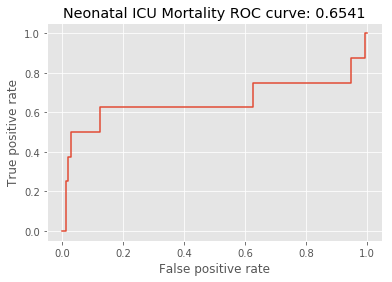

In [201]:
y_prob = logreg.predict_proba(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])

roc_auc = auc(fpr, tpr)
print 'AUROC: %.4f' % roc_auc
plt.plot(fpr, tpr)
plt.title('Neonatal ICU Mortality ROC curve: %.4f' % roc_auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.show()

### Question 4

Let's take a look at the clinical notes for the adult population.

In [217]:
notes_df = pd.read_csv('adult_notes.gz')

feature_col = 'chartext'
target_col = 'mort_oneyr'

ctxt = notes_df[feature_col]
vec = CountVectorizer(max_features=500,stop_words='english')

vec = vec.fit(ctxt)

is_train = notes_df['train'] == 1
is_test = notes_df['train'] == 0

X_train = normalize(vec.transform(notes_df[is_train][feature_col]), norm='l1', axis=0)
y_train = notes_df[is_train][target_col]

X_test = normalize(vec.transform(notes_df[is_test][feature_col]), norm='l1', axis=0)
y_test = notes_df[is_test][target_col]

logreg = LR()
logreg.fit(X_train, y_train)

coef_vars = sorted(zip((logreg.coef_[0]), vec.get_feature_names())) 

# What are the top five and bottom five predictors?
print 'TOP 5 HIGHEST'

for i,j in coef_vars[:5]:
    print '%s: %.4f' % (j,i)

print 
    
print 'TOP 5 LOWEST'
for i,j in coef_vars[-1:-6:-1]:
    print '%s: %.4f' % (j,i)

TOP 5 HIGHEST
fracture: -0.0547
cabg: -0.0501
diet: -0.0453
alert: -0.0353
oriented: -0.0332

TOP 5 LOWEST
levophed: 0.1888
sepsis: 0.1465
worsening: 0.1307
liver: 0.1241
picc: 0.1106


AUROC: 0.6422


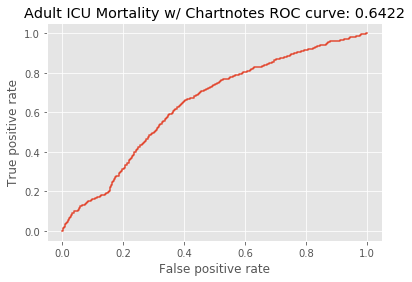

In [218]:
y_prob = logreg.predict_proba(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])

roc_auc = auc(fpr, tpr)
print 'AUROC: %.4f' % roc_auc
plt.plot(fpr, tpr)
plt.title('Adult ICU Mortality w/ Chartnotes ROC curve: %.4f' % roc_auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.show()

### Question 5

Now we combine our structured EHR data and the unstructured chart notes to predict in-ICU mortality. First we create the data by combining our two previous data sources on hadm_id. Note that since the chart notes are incomplete, we do an inner join.

Note that for the inner join, we assume that subject_id, hadm_id, and icustay_id are equal. Also for cleanness of data, we assume that the mort_icu, mort_oneyr, and mort_hosp scores are also the same. We would want to check that they are indeed all equal, but this merge just throws out data points where the ids or mortality is inconsistent.

In [219]:
comb_df = pd.merge(adult_df, notes_df,
                   how='inner', 
                   on=['hadm_id', 'subject_id', 'icustay_id', 
                       'mort_hosp', 'mort_icu', 'mort_oneyr'])

In [220]:
excl_col = set(['subject_id' ,'hadm_id', 'icustay_id', 'mort_hosp', 
            'mort_icu', 'mort_oneyr', 'train_x', 'train_y', 'chartext'
           ])
feature_col = [i for i in comb_df.columns if i not in excl_col]
target_col = 'mort_oneyr'

ctxt = comb_df['chartext']
vec = CountVectorizer(max_features=500,stop_words='english')
vec = vec.fit(ctxt)

is_train = comb_df['train_x'] == 1
train_idx = comb_df[is_train].index

is_test = comb_df['train_x'] == 0
test_idx = comb_df[is_test].index

X = sp.sparse.hstack((vec.transform(comb_df['chartext']),
                    comb_df[feature_col].values), format='csr'
                    )

X = normalize(X, norm='l1', axis=0)
X_cols = vec.get_feature_names() + feature_col

X_train = X[train_idx,:]
y_train = comb_df[is_train][target_col]

X_test = X[test_idx,:]
y_test = comb_df[is_test][target_col]

logreg = LR()
logreg.fit(X_train, y_train)

coef_vars = sorted(zip((logreg.coef_[0]), X_cols)) 

# What are the top five and bottom five predictors?
print 'TOP 5 HIGHEST'

for i,j in coef_vars[:5]:
    print '%s: %.4f' % (j,i)

print 
    
print 'TOP 5 LOWEST'
for i,j in coef_vars[-1:-6:-1]:
    print '%s: %.4f' % (j,i)

TOP 5 HIGHEST
admType_ELECTIVE: -0.0576
diet: -0.0349
cabg: -0.0325
fracture: -0.0294
alert: -0.0269

TOP 5 LOWEST
levophed: 0.1235
liver: 0.0883
worsening: 0.0815
sepsis: 0.0784
picc: 0.0715


AUROC: 0.6561


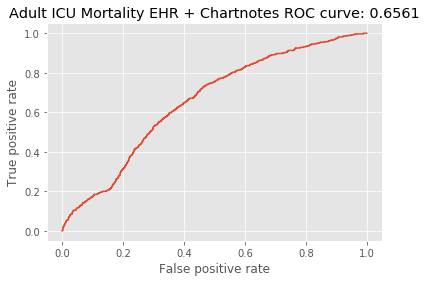

In [221]:
y_prob = logreg.predict_proba(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])

roc_auc = auc(fpr, tpr)
print 'AUROC: %.4f' % roc_auc
plt.plot(fpr, tpr)
plt.title('Adult ICU Mortality EHR + Chartnotes ROC curve: %.4f' % roc_auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.show()

## Section 2

Now we're onto babies!

In [2]:
# Read adult_icu.gz
singl_df = pd.read_csv('singletons.gz')
singl_df.head()

,mort,csex,dbirwt,dmage,mrace,dmeduc,dmar,dlivord,mpcb,anemia,...,rh,uterine,othermr,tobacco,alcohol,dfage,frace,dfeduc,infant_id,term
0,0,1,2977.0,29,white,highschool,0,2.0,2.0,0,...,0,1,0,0,0,22.0,white,highschool,0,0.0
1,0,2,3912.0,25,white,college,1,2.0,3.0,0,...,0,0,0,0,0,25.0,white,college,1,1.0
2,0,1,3317.0,36,white,morethancollege,1,3.0,2.0,0,...,0,0,0,0,0,33.0,white,college,2,0.0
3,0,2,2963.0,30,white,college,1,2.0,1.0,0,...,0,0,0,0,0,31.0,white,college,3,0.0
4,0,2,3572.0,25,white,highschool,1,3.0,2.0,0,...,0,0,0,0,0,26.0,white,highschool,4,2.0


In [224]:
singl_df['is_underweight'] = singl_df['dbirwt'] < 2700

### Question 1
The previous RA wanted to examine whether or not birthweight would impact mortality using twins because all other factors (mother characteristics, dad characteristics) would be held constant. The birth weight would then be more easy to directly relate causally to the mortality rate.

Here, the outcome (Y) is infant one-year mortality, and the treatment is birthweight under 2700 grams.

Y1 would be infant death and Y0 would be infant still alive at one year.

We then want to find E[Y1 - Y0] = E[Y1 | T=1] - E[Y0 | T=0]

In [227]:
tw_df = pd.read_csv('twins.gz')
tw_df.head()

,mort,csex,dbirwt,dmage,mrace,dmeduc,dmar,dlivord,mpcb,anemia,...,othermr,tobacco,alcohol,dfage,frace,dfeduc,infant_id,pair_id,term,id
0,0,1,2601.0,22,black,college,1,2.0,3.0,0,...,1,0,0,30.0,black,highschool,2,3,0.0,1.0
1,0,2,3069.0,22,black,college,1,2.0,3.0,0,...,1,0,0,30.0,black,highschool,3,3,0.0,2.0
2,0,1,2948.0,24,white,highschool,1,2.0,1.0,0,...,0,0,0,30.0,white,college,4,5,0.0,1.0
3,0,2,2948.0,24,white,highschool,1,3.0,1.0,0,...,0,0,0,30.0,white,college,5,5,0.0,2.0
4,0,1,3345.0,32,white,highschool,1,2.0,2.0,0,...,0,0,0,36.0,white,highschool,8,9,0.0,1.0


In [248]:
# find twins where one is above and one is below

tw_df['is_underweight'] = tw_df['dbirwt'] < 2700

bal_pair = tw_df.groupby('pair_id')['is_underweight'].sum() == 1

In [249]:
bal_ids = bal_pair[bal_pair].index
print 'Total number twins: %d' % len(tw_df)
print 'Number balanced twins: %d' % (len(bal_ids) * 2)

bal_ids = set(bal_ids)

is_bal = lambda pid: pid in bal_ids

tw_df['is_bal_pair'] = tw_df['pair_id'].apply(is_bal)

tw_df[tw_df['is_bal_pair']].groupby('is_underweight')['mort'].mean()

Total number twins: 59052
Number balanced twins: 19800


is_underweight
False    0.005253
True     0.037980
Name: mort, dtype: float64

From above, we see that our estimate of the mortality rate for babies born underweight is 0.03798 whereas our estimate for the mortality rate for babies born normal weights is 0.005253. Note that this population is only for twins where one twin is normal weight and one twin is underweight.

Our ATE is then 0.032727, or a 3% increase in morality.

Note that we only can see this in the dataset with twins since the mortality rate among twins and singletons is not similar at all. We assume this might be because of greater risks when carrying twins than with singletons.

In [229]:
print 'Singleton mortality: %.4f' % singl_df['mort'].mean()
print 'Twin mortality: %.4f' % tw_df['mort'].mean()

Singleton mortality: 0.0050
Twin mortality: 0.0346


### Question 2
Now we are looking at a covariate adjustment to estimate the effect of a mother's smoking habits (feature: tobacco) on a baby's birthweight. Instead of a binary (underweight or not), we are going to be looking at the continuous case.

In [278]:
excl_col = set([
    'mort', 'dbirwt', 'mrace', 'dmeduc', 'infant_id', 'dfeduc', 'frace',
    'is_underweight', 'term', 'lung', 'alcohol'
])
singl_df['meth_white'] = singl_df['mrace'] == 'white'
singl_df['meth_black'] = singl_df['mrace'] == 'black'
singl_df['medu_hs'] = singl_df['dmeduc'] == 'highschool'
singl_df['medu_col'] = singl_df['dmeduc'] == 'college'
singl_df['medu_pluscol'] = singl_df['dmeduc'] == 'morethancollege'
singl_df['feth_white'] = singl_df['frace'] == 'white'
singl_df['feth_black'] = singl_df['frace'] == 'black'
singl_df['fedu_hs'] = singl_df['dfeduc'] == 'highschool'
singl_df['fedu_col'] = singl_df['dfeduc'] == 'college'
singl_df['fedu_pluscol'] = singl_df['dfeduc'] == 'morethancollege'

target_col = 'dbirwt'
f_col = [i for i in singl_df.columns if i not in excl_col]

X = singl_df[f_col]
y = singl_df[target_col]

linR = LinR()
linR.fit(X,y)

coef_vars = sorted(zip((linR.coef_), f_col))

# What are the top five and bottom five predictors?
print 'TOP 5 HIGHEST'

for i,j in coef_vars[-1:-6:-1]:
    print '%s: %.4f' % (j,i)

print 
    
print 'TOP 5 LOWEST'
for i,j in coef_vars[:5]:
    print '%s: %.4f' % (j,i)
    
print 

for i,j in coef_vars:
    if j == 'tobacco':
        print '%s: %.4f' % (j,i)

TOP 5 HIGHEST
pre4000: 519.3049
feth_white: 128.5478
hemo: 123.0741
meth_white: 118.0809
medu_pluscol: 114.3845

TOP 5 LOWEST
incervix: -529.7874
uterine: -460.8247
eclamp: -459.1933
preterm: -424.7225
hydra: -243.2448

tobacco: -159.4854


We see that tobacco (a binary variable) is predicted to have an effect on infant birthweight by decreasing it almost 187 grams.

Examples of features we should not include in the model: infant mortality, infant_id. Additionally we choose to omit the lung variable since that also may be related to tobacco use. Since alcohol and tobacco use are sometimes correlated, we also removed the alcohol variable.

### Question 3
Now we calculate the propensity score.

$$ \dfrac{1}{n} \sum_{i | t_i = 1} \frac{y_i}{p(t_i = 1|x_i) - \frac{1}{n}\sum_{i | t_i = 0}\frac{y_i}{p(t_i = 0|x_i)$$

We use a logistic regression to estimate P(T = t | x). We include confounders that are hypothesized to be associated with both treatment and outcome. Note that we train our logistic regression on the full dataset.

In [3]:
excl_col = set([
    'mort', 'dbirwt', 'mrace', 'dmeduc', 'infant_id', 'dfeduc', 'frace',
    'is_underweight', 'term', 'tobacco'
])
singl_df['meth_white'] = singl_df['mrace'] == 'white'
singl_df['meth_black'] = singl_df['mrace'] == 'black'
singl_df['medu_hs'] = singl_df['dmeduc'] == 'highschool'
singl_df['medu_col'] = singl_df['dmeduc'] == 'college'
singl_df['medu_pluscol'] = singl_df['dmeduc'] == 'morethancollege'
singl_df['feth_white'] = singl_df['frace'] == 'white'
singl_df['feth_black'] = singl_df['frace'] == 'black'
singl_df['fedu_hs'] = singl_df['dfeduc'] == 'highschool'
singl_df['fedu_col'] = singl_df['dfeduc'] == 'college'
singl_df['fedu_pluscol'] = singl_df['dfeduc'] == 'morethancollege'

target_col = 'tobacco'
f_col = [i for i in singl_df.columns if i not in excl_col]

X = singl_df[f_col]
y = singl_df[target_col]

lr = LR()
lr.fit(X,y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

array([[ 0.88913704,  0.11086296],
       [ 0.93059943,  0.06940057]])

In [ ]:
lr_pred = lambda x: lr.predict_proba(x)[0][1]
X['p_ti'] = X.apply(lr_pred, axis=1)

X_t1 = X[singl_df['tobacco'] == 1]
X_t0 = X[singl_df['tobacco'] == 0]

ti_1 = X_t1[target_col] / X_tl['p_ti']
ti_1 = ti_1.sum() / len(ti_1)

ti_0 = X_t0[target_col] / X_t0['p_t0']
ti_0 = ti_0.sum() / len(ti_0)

print ti_1 - ti_0

/Users/irenechen/Documents/venv/lib/python2.7/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
/Users/irenechen/Documents/venv/lib/python2.7/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
/Users/irenechen/Documents/venv/lib/python2.7/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1